In [1]:
from deepface import DeepFace
import matplotlib.pyplot as plt
# from deepface.basemodels import VGGFace, OpenFace, Facenet
import pandas as pd

# 1. Face Detection

In [65]:
backends = ['opencv', 'ssd', 'dlib', 'mtcnn', 'retinaface', 'mediapipe']

face = DeepFace.extract_faces('database/victoria/5.jpeg',
                    detector_backend='retinaface',
                    align=True,)

25-01-28 18:33:07 - retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /Users/victoria-m4/.deepface/weights/retinaface.h5
100%|██████████| 119M/119M [00:08<00:00, 14.5MB/s] 


In [76]:
print(type(face))
print(type(face[0]))
print(face[0].keys())

<class 'list'>
<class 'dict'>
dict_keys(['face', 'facial_area', 'confidence'])


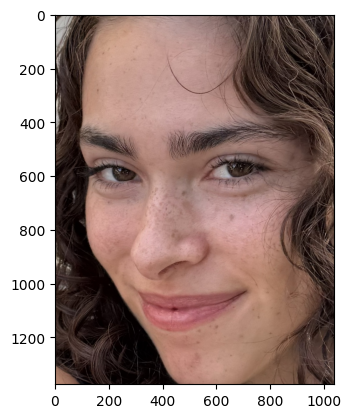

In [ ]:
# need to access the face like this
plt.imshow(face[0]['face'])

In [2]:
import os
from deepface import DeepFace
import matplotlib.pyplot as plt
from tqdm import tqdm


Processing directory: victoria


Processing victoria:   0%|          | 0/15 [00:00<?, ?it/s]

Success: 10.jpeg


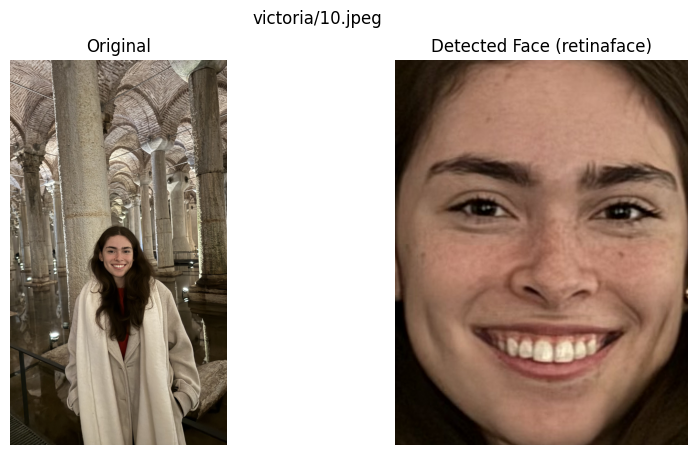

Processing victoria:   7%|▋         | 1/15 [00:02<00:37,  2.66s/it]

Success: 1.jpeg


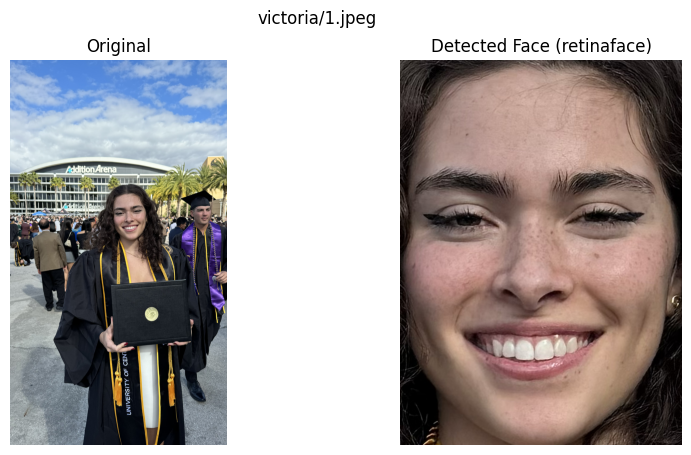

Processing victoria:  13%|█▎        | 2/15 [00:09<01:10,  5.39s/it]

Success: 11.jpeg


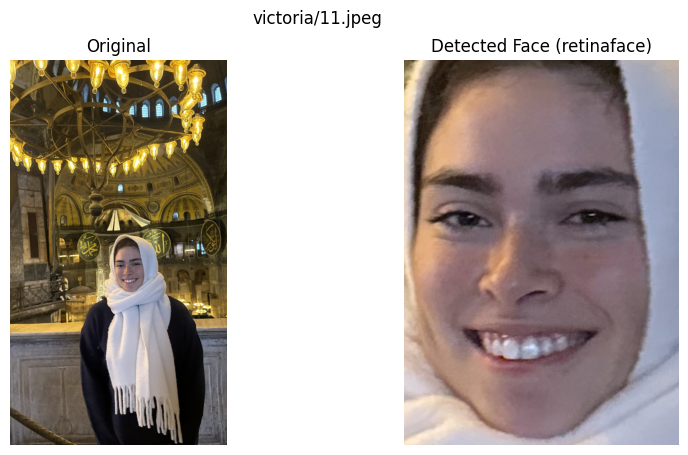

Processing victoria:  20%|██        | 3/15 [00:12<00:50,  4.17s/it]

Success: 14.jpg


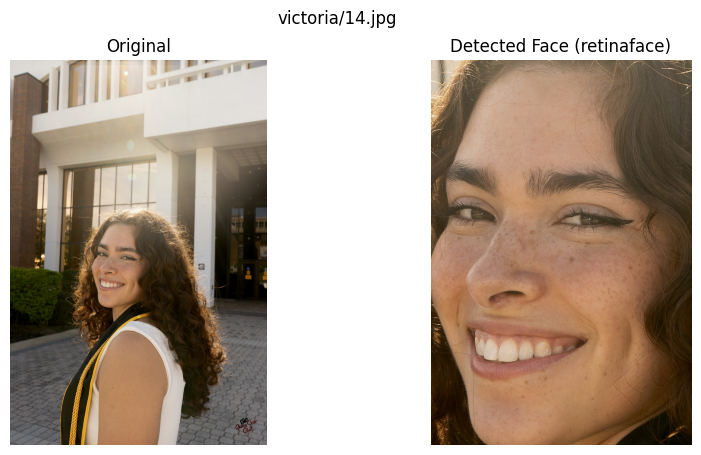

Processing victoria:  27%|██▋       | 4/15 [00:17<00:47,  4.32s/it]

Success: 6.jpeg


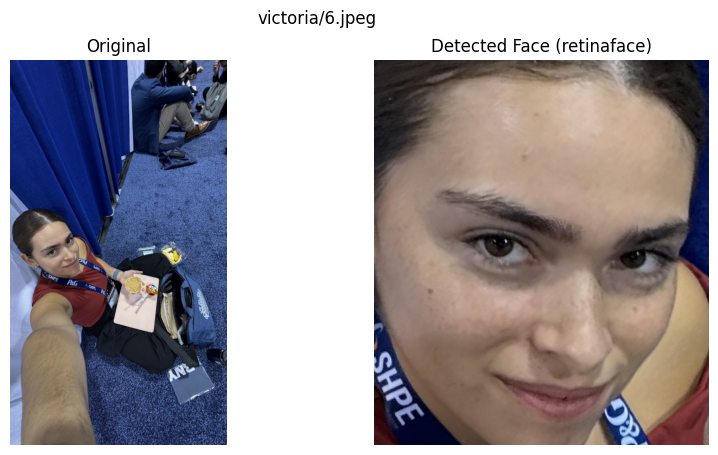

Processing victoria:  33%|███▎      | 5/15 [00:19<00:37,  3.71s/it]

Success: 7.jpeg


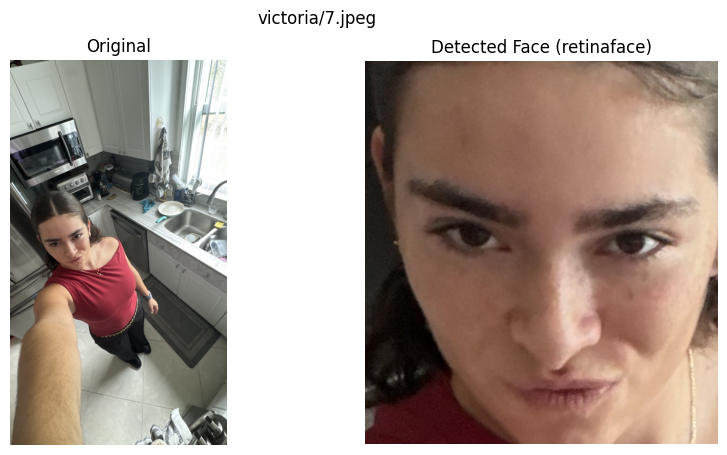

Processing victoria:  40%|████      | 6/15 [00:22<00:29,  3.33s/it]

Success: 8.jpeg


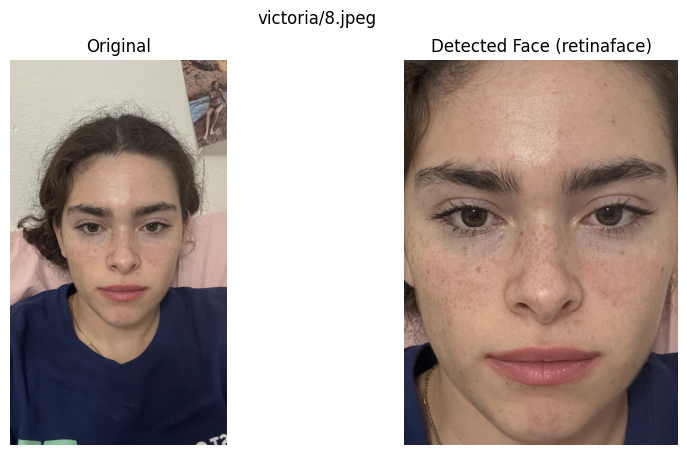

Processing victoria:  47%|████▋     | 7/15 [00:24<00:22,  2.80s/it]

Success: 4.jpeg


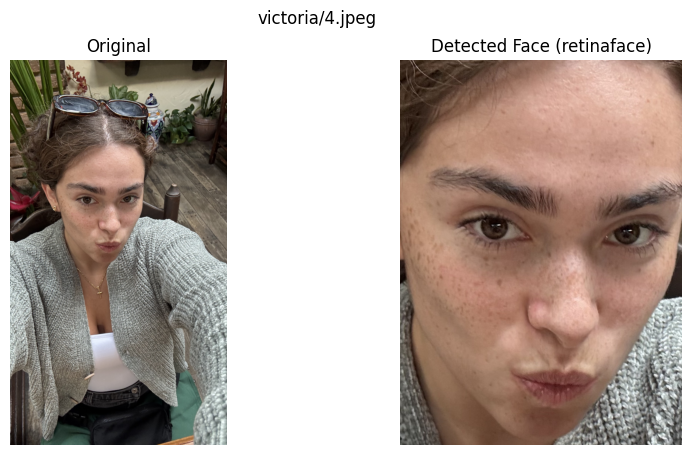

Processing victoria:  53%|█████▎    | 8/15 [00:26<00:19,  2.78s/it]

Success: 15.jpeg


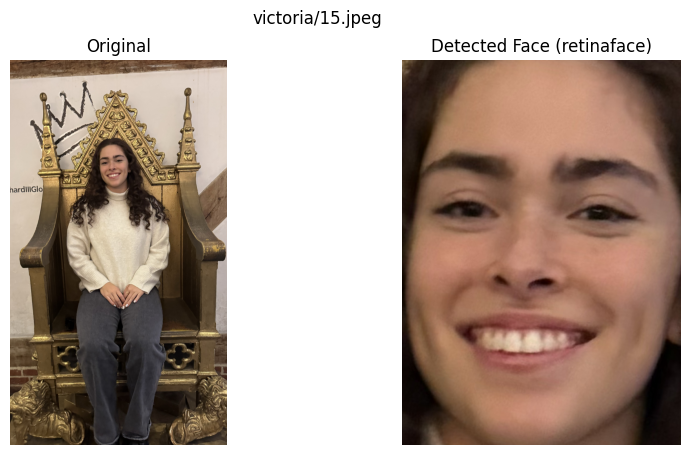

Processing victoria:  60%|██████    | 9/15 [00:30<00:18,  3.08s/it]

Success: 5.jpeg


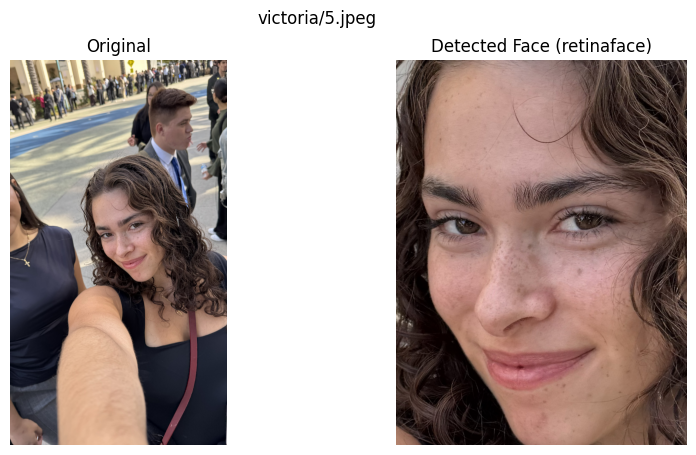

Processing victoria:  67%|██████▋   | 10/15 [00:39<00:24,  4.98s/it]

Success: 9.jpeg


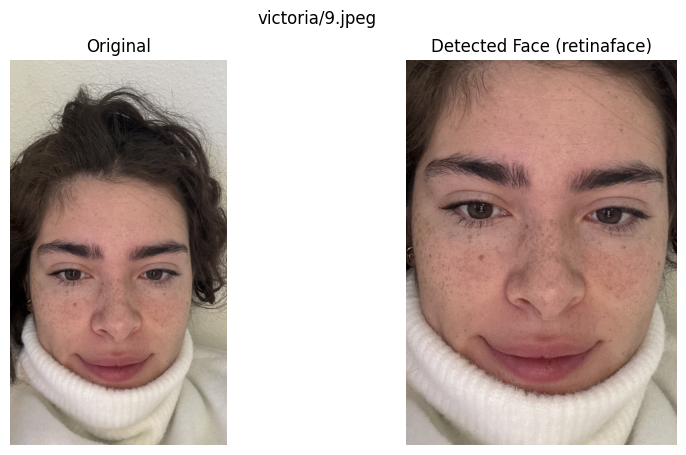

Processing victoria:  73%|███████▎  | 11/15 [00:42<00:16,  4.15s/it]

Success: 2.jpeg


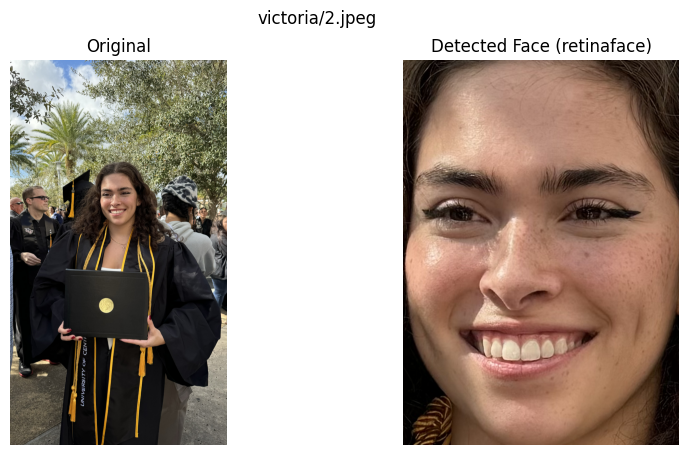

Processing victoria:  80%|████████  | 12/15 [00:49<00:15,  5.15s/it]

Success: 12.jpeg


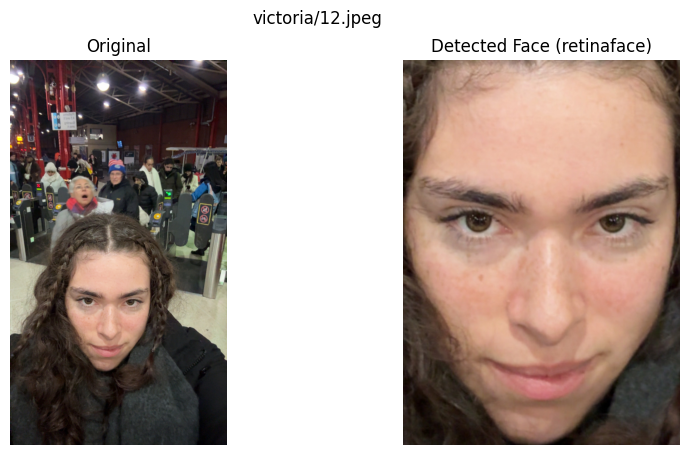

Processing victoria:  87%|████████▋ | 13/15 [00:53<00:09,  4.71s/it]

Success: 13.jpeg


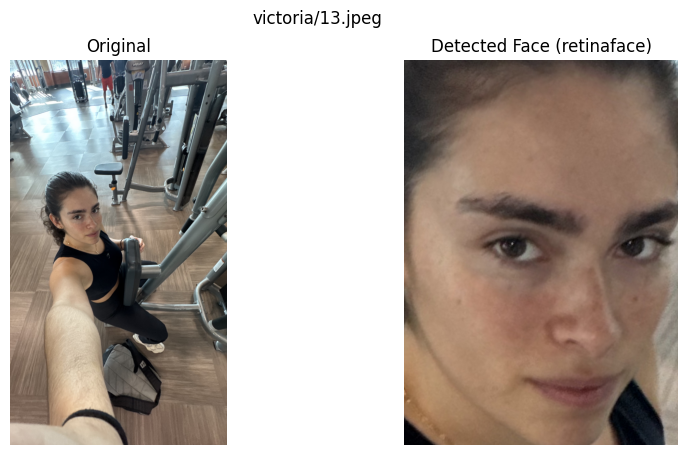

Processing victoria:  93%|█████████▎| 14/15 [00:56<00:04,  4.11s/it]

Success: 3.jpeg


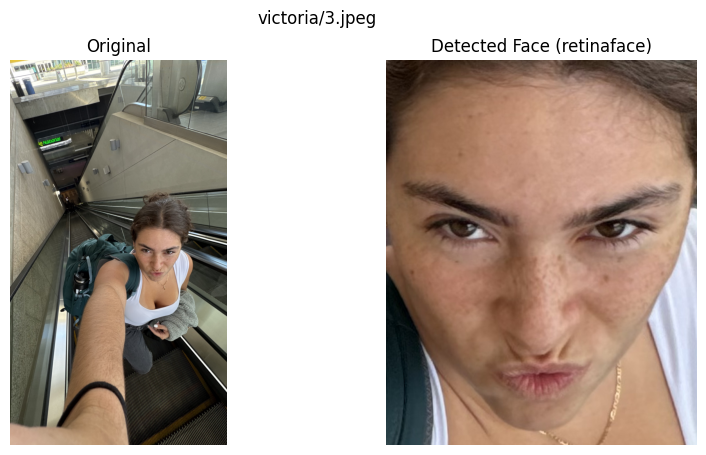

Processing victoria: 100%|██████████| 15/15 [00:58<00:00,  3.91s/it]



Processing directory: group


Processing group:   0%|          | 0/1 [00:00<?, ?it/s]

Success: IMG_6052.jpeg


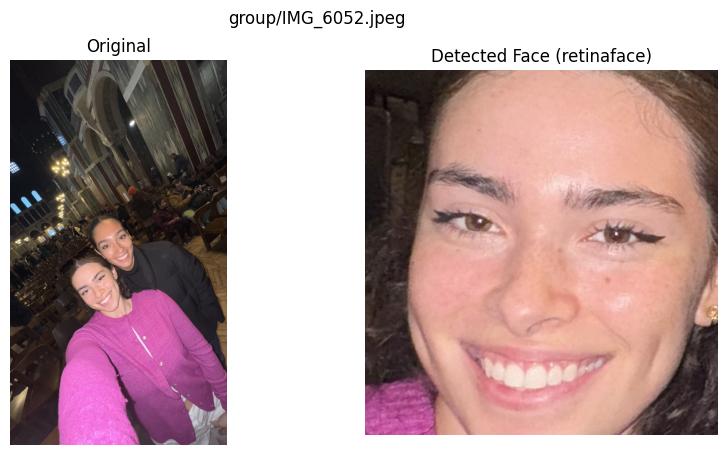

Processing group: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]



Processing directory: other


Processing other:   0%|          | 0/2 [00:00<?, ?it/s]

Success: img2.jpeg


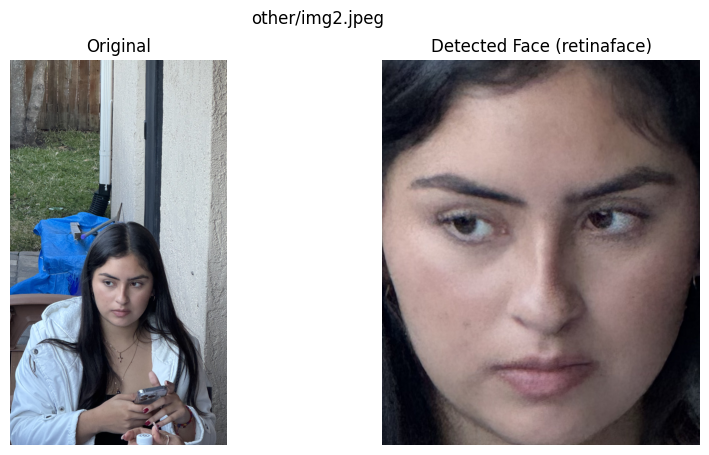

Processing other:  50%|█████     | 1/2 [00:02<00:02,  2.73s/it]

Success: IMG_4711.jpeg


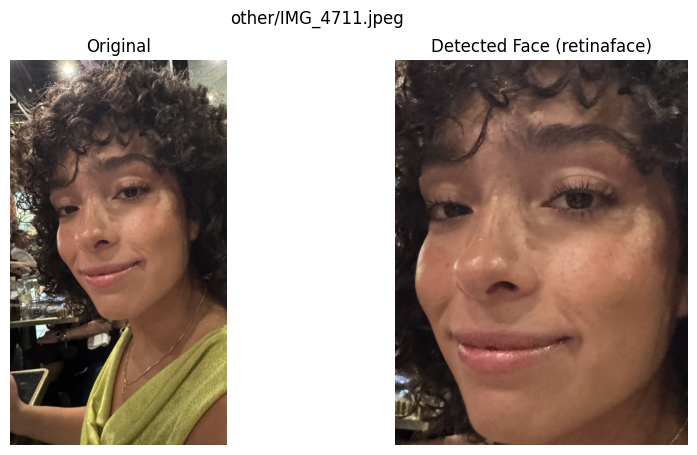

Processing other: 100%|██████████| 2/2 [00:05<00:00,  2.75s/it]


In [74]:
import os
from deepface import DeepFace
import matplotlib.pyplot as plt
from tqdm import tqdm

def test_and_show_detections(base_path, detector_backend='retinaface'):
    # Get all subdirectories
    subdirs = [d for d in os.listdir(base_path) 
              if os.path.isdir(os.path.join(base_path, d)) and not d.startswith('.')]
    
    plt.ion()  # Interactive mode on
    
    for subdir in subdirs:
        print(f"\nProcessing directory: {subdir}")
        folder_path = os.path.join(base_path, subdir)
        
        # Get all images
        image_files = [f for f in os.listdir(folder_path) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg', '.JPG', '.JPEG', '.PNG'))
                      and not f.startswith('.')]
        
        for img_file in tqdm(image_files, desc=f"Processing {subdir}"):
            img_path = os.path.join(folder_path, img_file)
            try:
                # Attempt face detection
                face = DeepFace.extract_faces(
                    img_path=img_path,
                    detector_backend=detector_backend,
                    enforce_detection=False,
                    align=True
                )
                
                plt.figure(figsize=(10, 5))
                plt.suptitle(f'{subdir}/{img_file}')
                
                # Original
                plt.subplot(1, 2, 1)
                plt.imshow(plt.imread(img_path))
                plt.title('Original')
                plt.axis('off')
                
                if len(face) > 0:
                    # Detected face
                    plt.subplot(1, 2, 2)
                    plt.imshow(face[0]['face'])
                    plt.title(f'Detected Face ({detector_backend})')
                    plt.axis('off')
                    print(f"Success: {img_file}")
                else:
                    print(f"No face detected: {img_file}")
                
                plt.show()
                plt.pause(0.5)  # Brief pause to render
                
            except Exception as e:
                print(f"Error with {img_file}: {str(e)}")
                plt.close()
                continue
            
            plt.close()

# Run it
test_and_show_detections('database', 'retinaface')

### Conclusion: Retinaface is best

# 2. Face Verification

In [7]:
import itertools
import os
from deepface import DeepFace
import matplotlib.pyplot as plt
from tqdm import tqdm

VGG-Face True


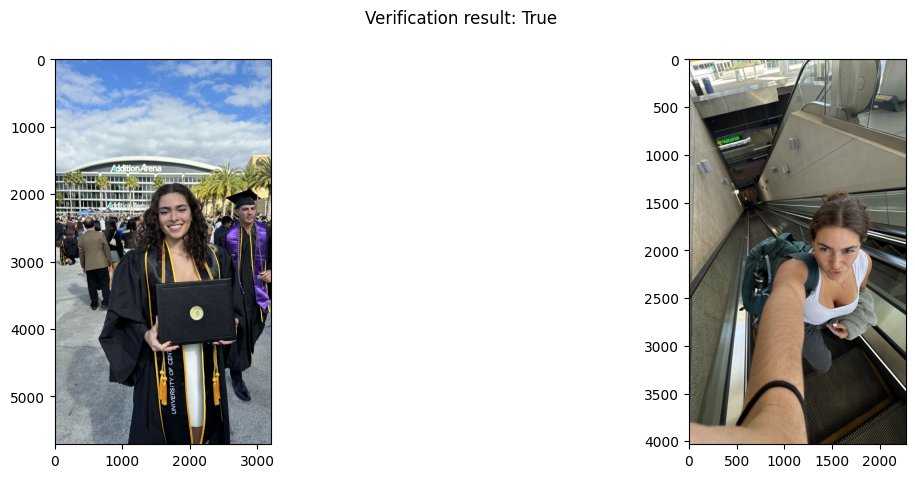

Facenet True


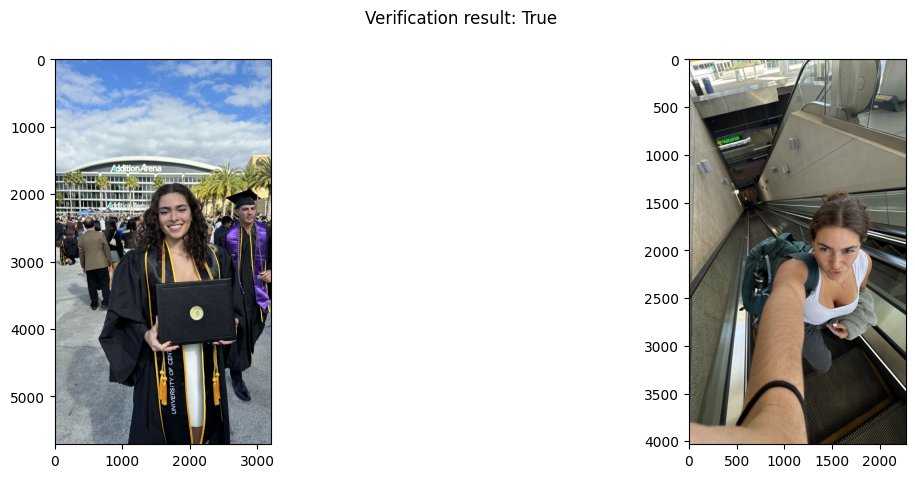

25-01-28 19:05:02 - facenet512_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facenet512_weights.h5
To: /Users/victoria-m4/.deepface/weights/facenet512_weights.h5
100%|██████████| 95.0M/95.0M [00:06<00:00, 14.2MB/s]


Facenet512 True


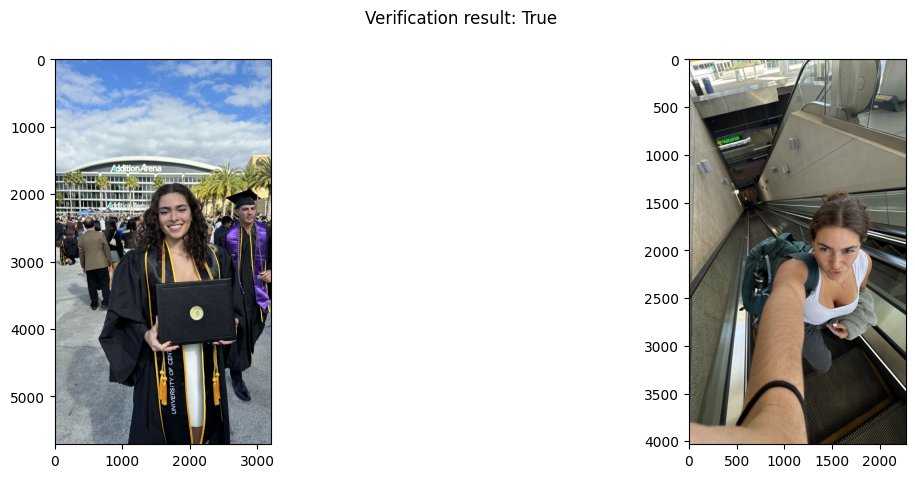

OpenFace False


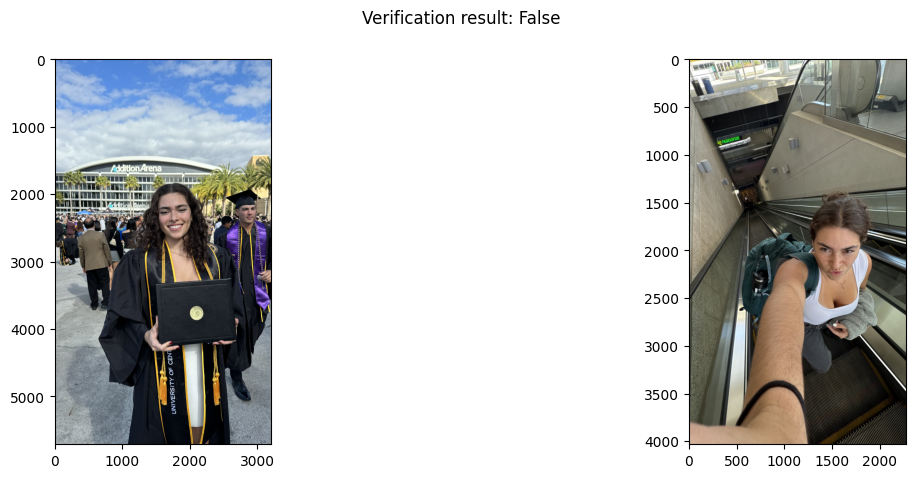

DeepID False


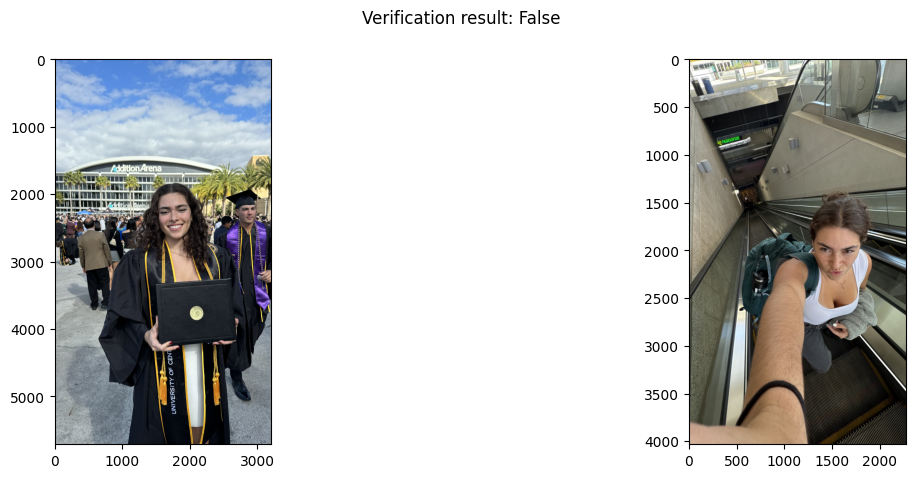

Dlib True


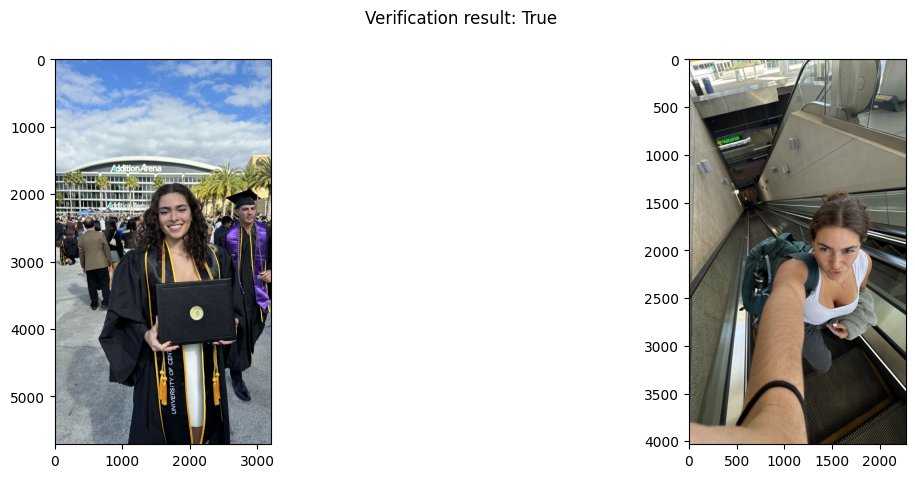

ArcFace True


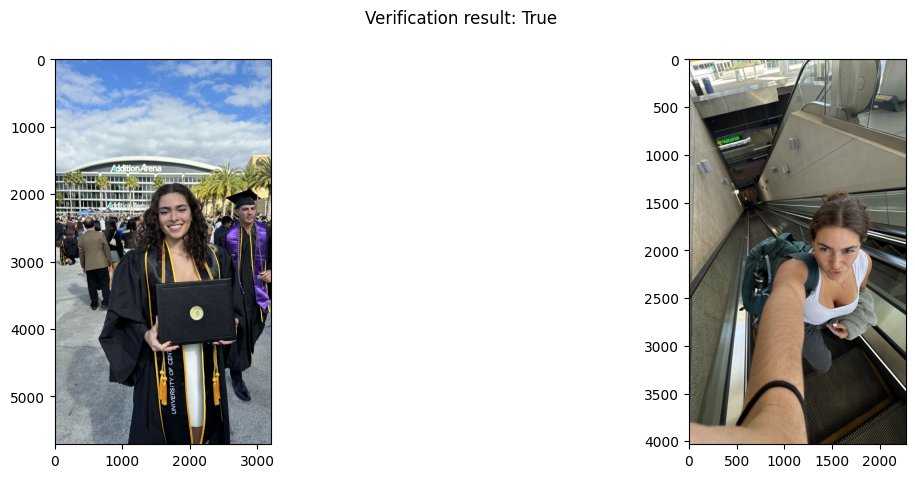

25-01-28 19:05:44 - face_recognition_sface_2021dec.onnx weights will be downloaded...


Downloading...
From: https://github.com/opencv/opencv_zoo/raw/main/models/face_recognition_sface/face_recognition_sface_2021dec.onnx
To: /Users/victoria-m4/.deepface/weights/face_recognition_sface_2021dec.onnx
100%|██████████| 38.7M/38.7M [00:01<00:00, 33.1MB/s]


SFace False


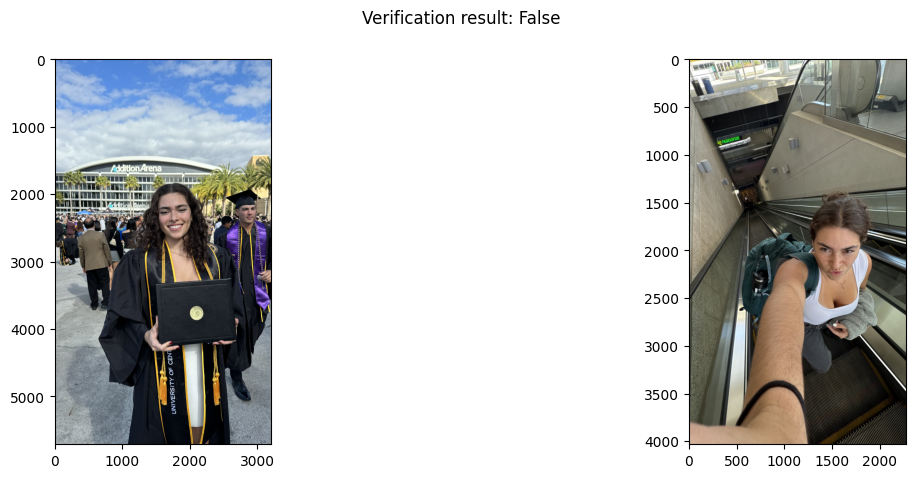

In [5]:
models = ["VGG-Face", "Facenet", "Facenet512", "OpenFace", "DeepID", "Dlib", "ArcFace", "SFace"] # "DeepFace", 
#face verification
for model in models:
    verification = DeepFace.verify(img1_path="database/victoria/1.jpeg", 
                                   img2_path="database/victoria/3.jpeg", 
                                   model_name = model,)
    print(verification.get("model") , verification.get("verified"))

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].imshow(plt.imread("database/victoria/1.jpeg"))
    axs[1].imshow(plt.imread("database/victoria/3.jpeg"))
    fig.suptitle("Verification result: " + str(verification.get("verified")))
    plt.show()

In [9]:
def evaluate_face_models(database_path):
    models = ["VGG-Face", "Facenet", "Facenet512", "OpenFace", "DeepID", "Dlib", "ArcFace", "SFace"]
    
    # Get images from both folders
    victoria_path = os.path.join(database_path, 'victoria')
    other_path = os.path.join(database_path, 'other')
    
    victoria_images = [f for f in os.listdir(victoria_path) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg')) 
                      and not f.startswith('.')]
    other_images = [f for f in os.listdir(other_path) 
                   if f.lower().endswith(('.png', '.jpg', '.jpeg')) 
                   and not f.startswith('.')]
    
    results = {model: {'true_positive': 0, 'true_negative': 0, 
                      'false_positive': 0, 'false_negative': 0} 
              for model in models}
    
    # Test same person comparisons (should be verified as True)
    victoria_pairs = list(itertools.combinations(victoria_images, 2))
    print("\nTesting Victoria vs Victoria pairs...")
    for img1, img2 in tqdm(victoria_pairs):
        img1_path = os.path.join(victoria_path, img1)
        img2_path = os.path.join(victoria_path, img2)
        
        for model in models:
            try:
                verification = DeepFace.verify(
                    img1_path=img1_path,
                    img2_path=img2_path,
                    model_name=model,
                    enforce_detection=False,
                    detector_backend='retinaface'
                )
                if verification["verified"]:
                    results[model]['true_positive'] += 1
                else:
                    results[model]['false_negative'] += 1
            except Exception as e:
                print(f"Error with {model} comparing {img1} and {img2}: {str(e)}")
    
    # Test different person comparisons (should be verified as False)
    print("\nTesting Victoria vs Other pairs...")
    diff_pairs = list(itertools.product([victoria_images[0]], other_images))  # Using first Victoria image
    for victoria_img, other_img in tqdm(diff_pairs):
        img1_path = os.path.join(victoria_path, victoria_img)
        img2_path = os.path.join(other_path, other_img)
        
        for model in models:
            try:
                verification = DeepFace.verify(
                    img1_path=img1_path,
                    img2_path=img2_path,
                    model_name=model,
                    enforce_detection=False,
                    detector_backend='retinaface'
                )
                if not verification["verified"]:
                    results[model]['true_negative'] += 1
                else:
                    results[model]['false_positive'] += 1
            except Exception as e:
                print(f"Error with {model} comparing {victoria_img} and {other_img}: {str(e)}")
    
    # Calculate and print metrics for each model
    print("\nResults Summary:")
    print("\nModel Performance Metrics:")
    for model in models:
        r = results[model]
        total_tests = r['true_positive'] + r['true_negative'] + r['false_positive'] + r['false_negative']
        accuracy = (r['true_positive'] + r['true_negative']) / total_tests if total_tests > 0 else 0
        precision = r['true_positive'] / (r['true_positive'] + r['false_positive']) if (r['true_positive'] + r['false_positive']) > 0 else 0
        recall = r['true_positive'] / (r['true_positive'] + r['false_negative']) if (r['true_positive'] + r['false_negative']) > 0 else 0
        
        print(f"\n{model}:")
        print(f"Accuracy: {accuracy:.2%}")
        print(f"Precision: {precision:.2%}")
        print(f"Recall: {recall:.2%}")
        print(f"True Positives: {r['true_positive']}")
        print(f"True Negatives: {r['true_negative']}")
        print(f"False Positives: {r['false_positive']}")
        print(f"False Negatives: {r['false_negative']}")

# Run the evaluation
evaluate_face_models('database')


Testing Victoria vs Victoria pairs...


100%|██████████| 105/105 [1:31:38<00:00, 52.37s/it]  



Testing Victoria vs Other pairs...


100%|██████████| 10/10 [05:29<00:00, 32.90s/it]


Results Summary:

Model Performance Metrics:

VGG-Face:
Accuracy: 93.04%
Precision: 98.99%
Recall: 93.33%
True Positives: 98
True Negatives: 9
False Positives: 1
False Negatives: 7

Facenet:
Accuracy: 80.87%
Precision: 100.00%
Recall: 79.05%
True Positives: 83
True Negatives: 10
False Positives: 0
False Negatives: 22

Facenet512:
Accuracy: 36.52%
Precision: 100.00%
Recall: 30.48%
True Positives: 32
True Negatives: 10
False Positives: 0
False Negatives: 73

OpenFace:
Accuracy: 11.30%
Precision: 100.00%
Recall: 2.86%
True Positives: 3
True Negatives: 10
False Positives: 0
False Negatives: 102

DeepID:
Accuracy: 10.43%
Precision: 100.00%
Recall: 1.90%
True Positives: 2
True Negatives: 10
False Positives: 0
False Negatives: 103

Dlib:
Accuracy: 53.04%
Precision: 100.00%
Recall: 48.57%
True Positives: 51
True Negatives: 10
False Positives: 0
False Negatives: 54

ArcFace:
Accuracy: 89.57%
Precision: 97.94%
Recall: 90.48%
True Positives: 95
True Negatives: 8
False Positives: 2
False Negative

### Conclusion: VGG Face and ArcFace are the best

# 3. Face Recognition

In [23]:
result = DeepFace.find(img_path='database/victoria/1.jpeg', 
              db_path='database/victoria', 
              model_name='VGG-Face', 
              detector_backend='retinaface', 
              enforce_detection=False,
              )

25-01-28 22:06:46 - Searching database/victoria/1.jpeg in 11 length datastore
25-01-28 22:06:52 - find function duration 6.034019947052002 seconds


In [25]:
print(type(result))
print(type(result[0]))
print(result[0].keys())
print(result[0].to_string())
print("len is", len(result[0]))

<class 'list'>
<class 'pandas.core.frame.DataFrame'>
Index(['identity', 'hash', 'target_x', 'target_y', 'target_w', 'target_h',
       'source_x', 'source_y', 'source_w', 'source_h', 'threshold',
       'distance'],
      dtype='object')
                    identity                                      hash  target_x  target_y  target_w  target_h  source_x  source_y  source_w  source_h  threshold  distance
0  database/victoria/15.jpeg  1036e4cf43ae52bb026a6d87aa84b1aa8dd54464      1317      1274       432       598      1524      1974       505       691       0.68  0.126482
1   database/victoria/14.jpg  d8579b48a7e5f13275dcd51ca6245557574c6c52      1291      2539       882      1306      1524      1974       505       691       0.68  0.302983
2  database/victoria/12.jpeg  8bff0682af99232c5f9e6f6a0eaa2ae144665908       313      1094       497       691      1524      1974       505       691       0.68  0.470960
3  database/victoria/13.jpeg  aed897b065763e14005e766563825822b306d65a    

In [26]:
result = DeepFace.find(img_path='database/victoria/1.jpeg', 
              db_path='database/other', 
              model_name='VGG-Face', 
              detector_backend='retinaface', 
              enforce_detection=False,
              )
print(result[0].to_string())

25-01-28 22:08:19 - Found 2 newly added image(s), 0 removed image(s), 0 replaced image(s).


Finding representations: 100%|██████████| 2/2 [00:02<00:00,  1.36s/it]


25-01-28 22:08:22 - There are now 2 representations in ds_model_vggface_detector_retinaface_aligned_normalization_base_expand_0.pkl
25-01-28 22:08:22 - Searching database/victoria/1.jpeg in 2 length datastore
25-01-28 22:08:28 - find function duration 8.73393177986145 seconds
Empty DataFrame
Columns: [identity, hash, target_x, target_y, target_w, target_h, source_x, source_y, source_w, source_h, threshold, distance]
Index: []


------------------------------------------------------------------------------------------------------------------------------

------------------------------------------------------------------------------------------------------------------------------

In [32]:
models = ["VGG-Face", "Facenet", "OpenFace", "DeepID", "Dlib", "ArcFace"] # "DeepFace", 
#face verification
dfs = []
for model in models:
    print(f"Processing model: {model}")
    # df = DeepFace.find(img_path = "grad_portrait.jpeg",db_path = "./pictures_victoria", model_name = model)
    df = DeepFace.find(img_path = "grad_portrait.jpeg",db_path = "./pictures_victoria", model_name = 'VGG-Face', model = model, distance_metric='cosine')
    
    # Check if df is a DataFrame
    if isinstance(df, list):
        dfs.extend(df)
    else:
        print(f"Warning: The result for model {model} is not a DataFrame")

Processing model: VGG-Face
25-01-28 17:57:16 - Found 0 newly added image(s), 1 removed image(s), 0 replaced image(s).
25-01-28 17:57:16 - There are now 13 representations in ds_model_vggface_detector_opencv_aligned_normalization_base_expand_0.pkl
25-01-28 17:57:16 - Searching grad_portrait.jpeg in 13 length datastore
25-01-28 17:57:17 - find function duration 0.6059000492095947 seconds
Processing model: Facenet
25-01-28 17:57:17 - Found 0 newly added image(s), 1 removed image(s), 0 replaced image(s).
25-01-28 17:57:17 - There are now 13 representations in ds_model_facenet_detector_opencv_aligned_normalization_base_expand_0.pkl
25-01-28 17:57:17 - Searching grad_portrait.jpeg in 13 length datastore
25-01-28 17:57:18 - find function duration 0.6963798999786377 seconds
Processing model: OpenFace
25-01-28 17:57:18 - Found 0 newly added image(s), 1 removed image(s), 0 replaced image(s).
25-01-28 17:57:18 - There are now 13 representations in ds_model_openface_detector_opencv_aligned_normali

In [34]:
for i, df in enumerate(dfs):
    print("Model", i)
    if df.shape[0] > 0:
        print(df.iloc[0].identity)

Model 0
./pictures_victoria/IMG_6102.jpeg
Model 1
./pictures_victoria/IMG4.jpeg
Model 2
./pictures_victoria/IMG_6102.jpeg
Model 3
./pictures_victoria/IMG4.jpeg
Model 4
./pictures_victoria/IMG_6102.jpeg
Model 5
./pictures_victoria/IMG_6102.jpeg
Model 6
Model 7
./pictures_victoria/img1.jpeg
Model 8
Model 9
Model 10
./pictures_victoria/img3.jpg
Model 11
./pictures_victoria/IMG4.jpeg
Model 12
./pictures_victoria/img2.jpeg
Model 13
./pictures_victoria/img3.jpg
Model 14
./pictures_victoria/IMG_6102.jpeg
Model 15
./pictures_victoria/IMG_6102.jpeg
Model 16
./pictures_victoria/IMG4.jpeg
Model 17
./pictures_victoria/img1.jpeg
